In [ ]:
!pip install pytorch-forecasting pytorch-lightning

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 127 kB 15.0 MB/s 
     |████████████████████████████████| 798 kB 44.5 MB/s 
     |████████████████████████████████| 308 kB 55.6 MB/s 
     |████████████████████████████████| 529 kB 44.2 MB/s 
     |████████████████████████████████| 87 kB 6.4 MB/s 
     |████████████████████████████████| 81 kB 3.7 MB/s 
     |████████████████████████████████| 209 kB 55.0 MB/s 
     |████████████████████████████████| 78 kB 7.6 MB/s 
     |████████████████████████████████| 50 kB 3.8 MB/s 
     |████████████████████████████████| 147 kB 36.5 MB/s 
     |████████████████████████████████| 112 kB 11.8 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=da77716cc1a53f2ee5bb679bc179555f4746991bed099d15ec80a9ce8aadebdd
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
  Create

In [ ]:
import os
import random
import warnings
warnings.filterwarnings("ignore")
import copy
from pathlib import Path

import datetime
import seaborn as sns
import matplotlib
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
%matplotlib inline


import numpy as np
import pandas as pd
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
import torch

from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.data.encoders import NaNLabelEncoder
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss, RMSE
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters

random.seed(30)
np.random.seed(30)

In [ ]:
data = pd.read_csv('https://raw.githubusercontent.com/dunfrey/tft-experiments/main/df_final.csv')

data['date'] = pd.to_datetime(data['date'], errors='coerce')

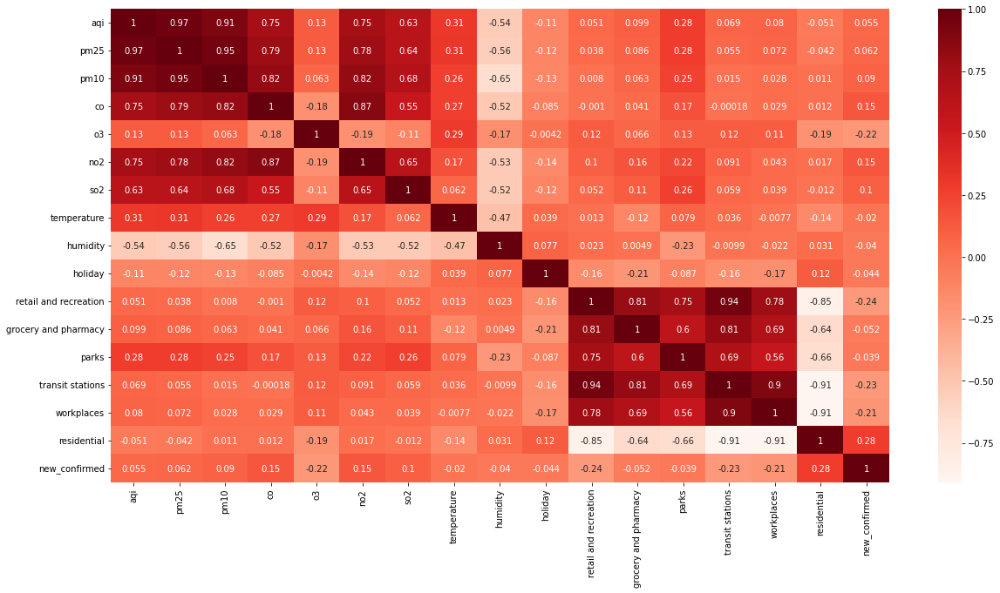

In [ ]:
plt.figure(figsize=(20,10))
cor = data.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [ ]:
data['new_confirmed'] = data['new_confirmed'].astype(float)

data['new_confirmed_level'] = pd.qcut(data['new_confirmed'], 5, labels=False).astype(str).astype("int")
data['aqi_level'] = pd.qcut(data['aqi'], 6, labels=False).astype(str).astype("int")

# add additional features
data["day_of_week"] = data.date.dt.dayofweek.astype(str).astype("int")  # categories have be strings
data["week_of_year"] = data.date.dt.weekofyear.astype(str).astype("int")  # categories have be strings
data["month"] = data.date.dt.month.astype(str).astype("int")  # categories have be strings

data['holiday'] = data['holiday'].astype(str).astype("int")

data["time_idx"] = data.index

In [ ]:
data

,date,aqi,pm25,pm10,co,o3,no2,so2,temperature,humidity,...,transit stations,workplaces,residential,new_confirmed,new_confirmed_level,aqi_level,day_of_week,week_of_year,month,time_idx
0,2020-02-25,67.333333,34.0,12.0,3.7,10.2,7.4,0.6,25.2,82.0,...,-46.0,-66.0,14.0,1.0,0,1,1,9,2,0
1,2020-02-26,50.000000,25.0,10.0,4.6,5.3,11.5,1.6,22.0,95.0,...,-19.0,-15.0,7.0,0.0,0,0,2,9,2,1
2,2020-02-27,42.000000,21.0,10.0,2.8,12.6,8.7,0.6,17.7,92.0,...,5.0,10.0,1.0,0.0,0,0,3,9,2,2
3,2020-02-28,50.000000,25.0,16.0,2.8,8.6,11.0,1.1,18.3,84.3,...,7.0,14.0,0.0,1.0,0,0,4,9,2,3
4,2020-02-29,59.166667,30.0,10.0,3.7,9.0,8.7,0.6,20.0,92.5,...,6.0,6.0,2.0,0.0,0,0,5,9,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
673,2021-12-29,117.333333,59.0,21.0,2.8,24.0,10.6,1.1,20.1,86.5,...,-23.0,-32.0,12.0,0.0,0,3,2,52,12,673
674,2021-12-30,83.666667,42.0,14.0,2.8,18.7,10.6,1.1,19.7,88.0,...,-26.0,-39.0,11.0,0.0,0,2,3,52,12,674
675,2021-12-31,42.000000,21.0,9.0,3.7,11.8,10.6,0.6,19.5,92.0,...,-50.0,-66.0,19.0,0.0,0,0,4,52,12,675
676,2022-01-01,91.833333,46.0,14.0,3.7,11.8,7.4,0.6,21.6,82.1,...,-59.0,-64.0,9.0,0.0,0,2,5,52,1,676


In [ ]:
data = data[['new_confirmed', 'new_confirmed_level', 'aqi', 'aqi_level', 
                     'pm25', 'pm10', 'co', 'o3', 'no2', 'so2', 'temperature', 'humidity', 
                     'retail and recreation', 'grocery and pharmacy', 'parks', 'transit stations', 'workplaces', 'residential',
                     'date', 'holiday', 'day_of_week', 'week_of_year', 'month', 'time_idx']]

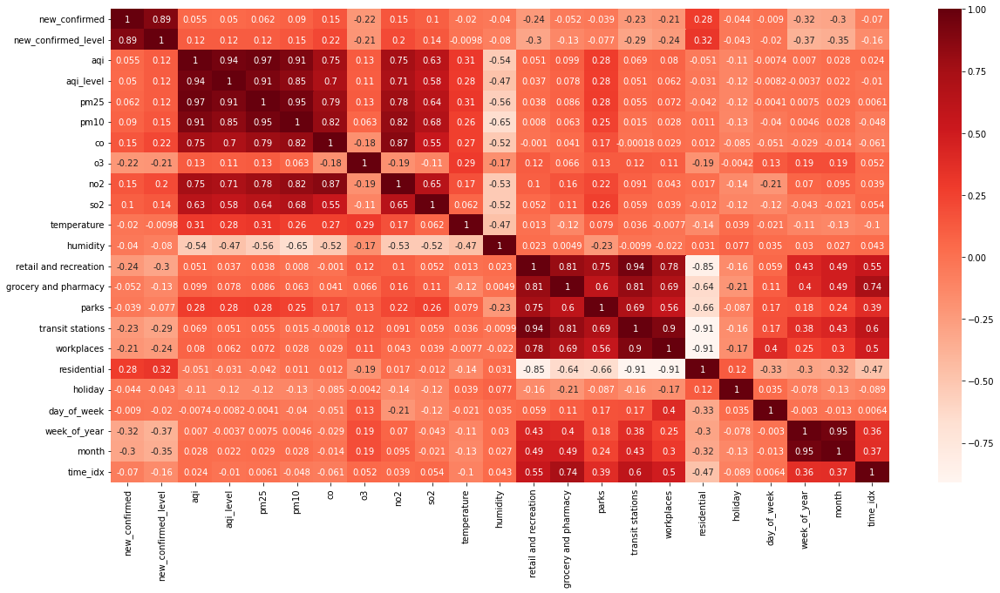

In [ ]:
plt.figure(figsize=(20,10))
cor = data.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

- `new_confirmed` positive to 
    - `residential`
- `new_confirmed` negative to 
    - `o3`, `retail and recreation`, `transit stations`, `workspaces`,  `week_of_year`
- `aqi` positive to 
    - `pm25`, `pm10`, `co`, `no2`, `so2`, `temperature`
- `aqi` negative to 
    - `humidity`
- `transit stations` positive to 
    - `retail and recreation`, `grocery and pharmacy`, `parks`, `workplaces`
- `transit stations` negative to 
    - `residential`

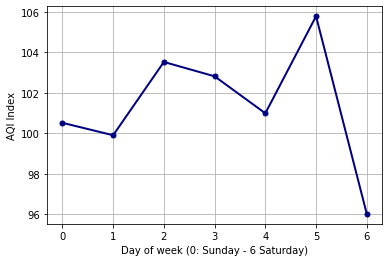

In [ ]:
gb_dayofweek_aqi = data.groupby(by=['day_of_week'])['aqi'].mean()

ax = gb_dayofweek_aqi.plot(lw=2, colormap='jet', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xlabel("Day of week (0: Sunday - 6 Saturday)")
ax.set_ylabel("AQI Index");

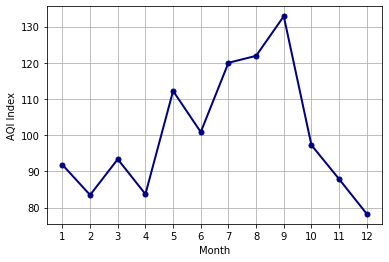

In [ ]:
gb_month_aqi = data.groupby(by=['month'])['aqi'].mean()

ax = gb_month_aqi.plot(lw=2, colormap='jet', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
ax.set_xlabel("Month")
ax.set_ylabel("AQI Index");

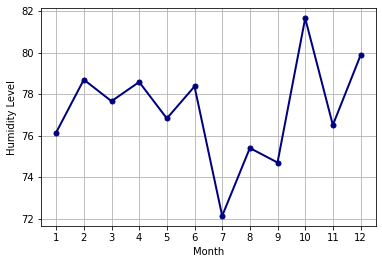

In [ ]:
gb_month_humidity = data.groupby(by=['month'])['humidity'].mean()

ax = gb_month_humidity.plot(lw=2, colormap='jet', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
ax.set_xlabel("Month")
ax.set_ylabel("Humidity Level");

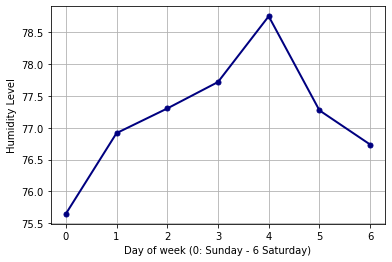

In [ ]:
gb_dayofweek_humidity = data.groupby(by=['day_of_week'])['humidity'].mean()

ax = gb_dayofweek_humidity.plot(lw=2, colormap='jet', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xlabel("Day of week (0: Sunday - 6 Saturday)")
ax.set_ylabel("Humidity Level");

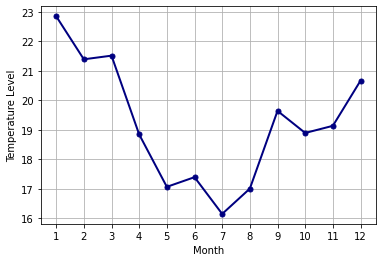

In [ ]:
gb_month_temperature = data.groupby(by=['month'])['temperature'].mean()

ax = gb_month_temperature.plot(lw=2, colormap='jet', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
ax.set_xlabel("Month")
ax.set_ylabel("Temperature Level");

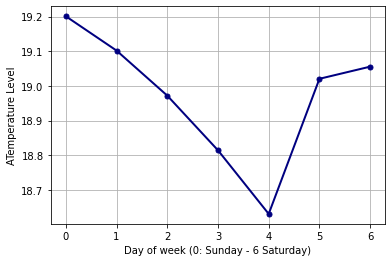

In [ ]:
gb_dayofweek_temperature = data.groupby(by=['day_of_week'])['temperature'].mean()

ax = gb_dayofweek_temperature.plot(lw=2, colormap='jet', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xlabel("Day of week (0: Sunday - 6 Saturday)")
ax.set_ylabel("ATemperature Level");

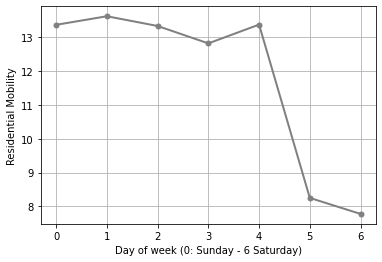

In [ ]:
gb_dayofweek_residential = data.groupby(by=['day_of_week'])['residential'].mean()

ax = gb_dayofweek_residential.plot(lw=2, color='gray', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xlabel("Day of week (0: Sunday - 6 Saturday)")
ax.set_ylabel("Residential Mobility");

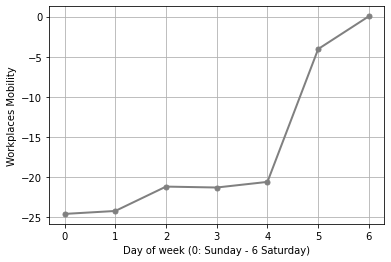

In [ ]:
gb_dayofweek_workplaces = data.groupby(by=['day_of_week'])['workplaces'].mean()

ax = gb_dayofweek_workplaces.plot(lw=2, color='gray', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xlabel("Day of week (0: Sunday - 6 Saturday)")
ax.set_ylabel("Workplaces Mobility");

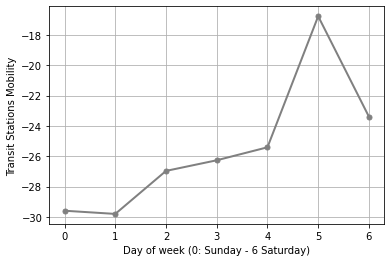

In [ ]:
gb_dayofweek_stations = data.groupby(by=['day_of_week'])['transit stations'].mean()

ax = gb_dayofweek_stations.plot(lw=2, color='gray', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xlabel("Day of week (0: Sunday - 6 Saturday)")
ax.set_ylabel("Transit Stations Mobility");

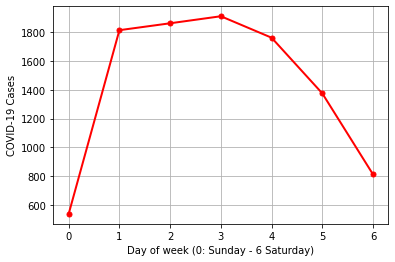

In [ ]:
gb_dayofweek_cases = data.groupby(by=['day_of_week'])['new_confirmed'].mean()

ax = gb_dayofweek_cases.plot(lw=2, color='red', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xlabel("Day of week (0: Sunday - 6 Saturday)")
ax.set_ylabel("COVID-19 Cases");

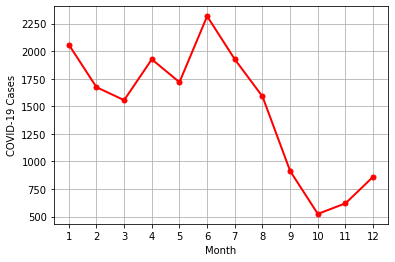

In [ ]:
gb_month_cases = data.groupby(by=['month'])['new_confirmed'].mean()

ax = gb_month_cases.plot(lw=2, color='red', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
ax.set_xlabel("Month")
ax.set_ylabel("COVID-19 Cases");

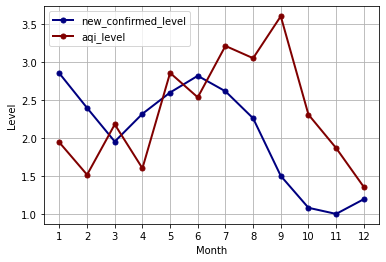

In [ ]:
gb_month_levels = data.groupby(by=['month'])['new_confirmed_level', 'aqi_level'].mean()

ax = gb_month_levels.plot(lw=2, colormap='jet', marker='.', markersize=10)
ax.grid(which='both')
ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
ax.set_xlabel("Month")
ax.set_ylabel("Level");

In [ ]:
data.columns

Index(['new_confirmed', 'new_confirmed_level', 'aqi', 'aqi_level', 'pm25',
       'pm10', 'co', 'o3', 'no2', 'so2', 'temperature', 'humidity',
       'retail and recreation', 'grocery and pharmacy', 'parks',
       'transit stations', 'workplaces', 'residential', 'date', 'holiday',
       'day_of_week', 'week_of_year', 'month', 'time_idx'],
      dtype='object')

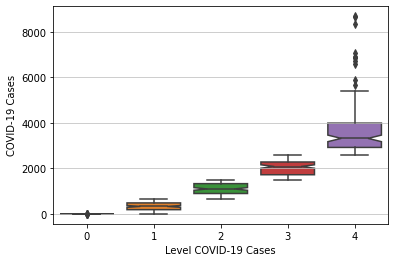

In [ ]:
fig, ax = plt.subplots(1, 1)
sns.boxplot(data=data, x="new_confirmed_level", y="new_confirmed",notch=True)
ax.grid(which='major', axis='y', linewidth=0.75, linestyle='-', color='0.75')
ax.grid(which='minor', axis='y', linewidth=0.25, linestyle='-', color='0.75')
ax.set_xlabel("Level COVID-19 Cases")
ax.set_ylabel("COVID-19 Cases");

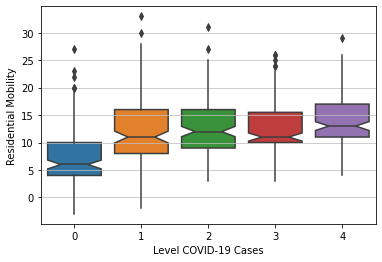

In [ ]:
fig, ax = plt.subplots(1, 1)
sns.boxplot(data=data, x="new_confirmed_level", y="residential",notch=True, showcaps=False,)
ax.grid(which='major', axis='y', linewidth=0.75, linestyle='-', color='0.75')
ax.grid(which='minor', axis='y', linewidth=0.25, linestyle='-', color='0.75')
ax.set_ylabel("Residential Mobility")
ax.set_xlabel("Level COVID-19 Cases");

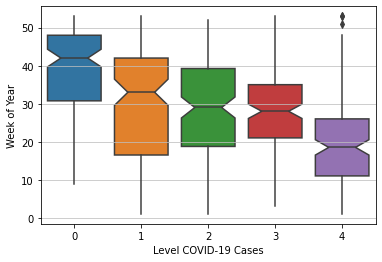

In [ ]:
fig, ax = plt.subplots(1, 1)
sns.boxplot(data=data, x="new_confirmed_level", y="week_of_year",notch=True, showcaps=False,)
ax.grid(which='major', axis='y', linewidth=0.75, linestyle='-', color='0.75')
ax.grid(which='minor', axis='y', linewidth=0.25, linestyle='-', color='0.75')
ax.set_ylabel("Week of Year")
ax.set_xlabel("Level COVID-19 Cases");

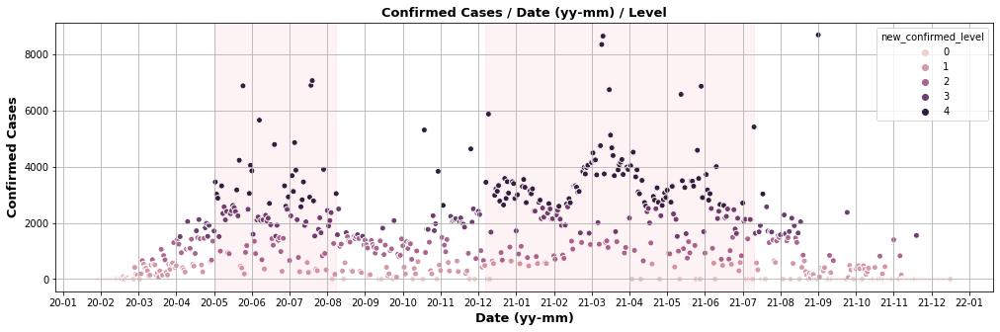

In [ ]:
fig, ax = plt.subplots(1, 1, figsize = (17, 5))
ax.axvspan(datetime.datetime.strptime('20-05-28', '%y-%m-%d'), 
          datetime.datetime.strptime('20-09-01', '%y-%m-%d'), 
          color="crimson", 
          alpha=0.05)
ax.axvspan(datetime.datetime.strptime('20-12-28', '%y-%m-%d'), 
          datetime.datetime.strptime('21-07-30', '%y-%m-%d'), 
          color="crimson", 
          alpha=0.05)

sns.scatterplot(x='date',y='new_confirmed',hue='new_confirmed_level',data=(data.groupby(['date', 'new_confirmed_level']).new_confirmed.sum().rename('new_confirmed')
                                                       .reset_index().sort_values('date', ascending = True, ignore_index=True)), linewidth = 1, alpha = 1)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%y-%m'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=30)) 
ax.grid(True)

ax.set_xlabel('Date (yy-mm)', color='black', fontweight='bold', fontsize=13)
ax.set_ylabel('Confirmed Cases', color='black', fontweight='bold', fontsize=13)
ax.set_title('Confirmed Cases / Date (yy-mm) / Level', fontweight = 'bold', fontsize = 13);

In [ ]:
data['new_confirmed_level'] = data['new_confirmed_level'].astype(str).astype("category")
data['aqi_level'] = data['aqi_level'].astype(str).astype("category")

# add additional features
data["day_of_week"] = data["day_of_week"].astype(str).astype("category")  # categories have be strings
data["week_of_year"] = data["day_of_week"].astype(str).astype("category")  # categories have be strings
data["month"] = data["day_of_week"].astype(str).astype("category")  # categories have be strings

data['holiday'] = data['holiday'].astype(str).astype("category")

In [ ]:
data.tail(50)

,new_confirmed,new_confirmed_level,aqi,aqi_level,pm25,pm10,co,o3,no2,so2,...,parks,transit stations,workplaces,residential,date,holiday,day_of_week,week_of_year,month,time_idx
478,0.0,0,50.000000,0,25.0,10.0,2.8,13.9,11.5,1.1,...,-16.0,-22.0,-13.0,12.0,2021-06-17,0,3,3,3,478
479,6862.0,4,83.666667,2,42.0,17.0,3.7,12.2,15.1,1.1,...,-4.0,-18.0,-9.0,12.0,2021-06-18,0,4,4,4,479
480,2900.0,4,109.166667,3,55.0,21.0,4.6,10.6,13.3,1.1,...,-21.0,-9.0,6.0,8.0,2021-06-19,0,5,5,5,480
481,1686.0,3,117.333333,3,59.0,23.0,4.6,14.3,9.2,0.6,...,1.0,-21.0,6.0,8.0,2021-06-20,0,6,6,6,481
482,926.0,2,67.333333,1,34.0,12.0,2.8,13.9,13.3,1.1,...,-27.0,-23.0,-13.0,12.0,2021-06-21,0,0,0,0,482
483,3720.0,4,83.666667,2,42.0,14.0,3.7,7.8,15.6,1.1,...,-34.0,-26.0,-13.0,13.0,2021-06-22,0,1,1,1,483
484,3172.0,4,50.000000,0,25.0,10.0,2.8,13.0,11.0,0.6,...,-18.0,-23.0,-12.0,13.0,2021-06-23,0,2,2,2,484
485,2808.0,4,91.833333,2,46.0,20.0,4.6,10.6,15.6,1.1,...,-6.0,-21.0,-12.0,12.0,2021-06-24,0,3,3,3,485
486,3038.0,4,155.000000,5,78.0,42.0,7.3,6.5,28.4,2.1,...,0.0,-17.0,-7.0,11.0,2021-06-25,0,4,4,4,486
487,2511.0,3,163.000000,5,82.0,40.0,6.4,11.4,21.5,1.1,...,4.0,-7.0,9.0,6.0,2021-06-26,0,5,5,5,487


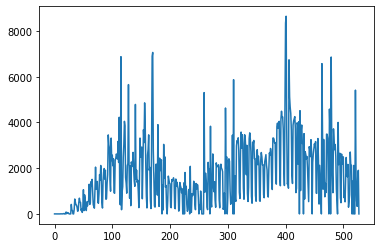

In [ ]:
data[:-150]['new_confirmed'].plot()

In [ ]:
data = data[:-150]

# Dataset Building

In [ ]:
max_prediction_length = 8
max_encoder_length = max_prediction_length*8
training_cutoff = data["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    data[lambda x: x.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="new_confirmed",
    group_ids=["new_confirmed_level", "day_of_week"],
    min_encoder_length=max_prediction_length // 2,  # keep encoder length long (as it is in the validation set)
    max_encoder_length=max_prediction_length,
    min_prediction_length=1,
    max_prediction_length=max_prediction_length,
    time_varying_known_categoricals=["holiday", "month", "day_of_week", "week_of_year"],
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_categoricals=["new_confirmed_level", "aqi_level"],
    time_varying_unknown_reals=[
        "new_confirmed", 'aqi', 'pm25', 'pm10', 'co', 'o3', 'no2', 'so2', 'temperature',
        'humidity', 'retail and recreation', 'grocery and pharmacy',
        'parks', 'transit stations', 'workplaces', 'residential',
    ],
    target_normalizer=GroupNormalizer(
        groups=["new_confirmed_level", "day_of_week"], transformation="softplus"
    ),  # use softplus and normalize by group
    categorical_encoders={
        'week_of_year':NaNLabelEncoder(add_nan=True)
    },
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
    allow_missing_timesteps=True
)

# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(training, data, predict=True, stop_randomization=True)

# create dataloaders for model
batch_size = 32  # set this between 32 to 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

In [ ]:
# calculate baseline mean absolute error, i.e. predict next value as the last available value from the history
actuals = torch.cat([y for x, (y, weight) in iter(val_dataloader)])
baseline_predictions = Baseline().predict(val_dataloader)
(actuals - baseline_predictions).abs().mean().item()

154.01136779785156

# TFT Model

## Training

In [ ]:
# configure network and trainer
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-5, patience=50, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=200,
    enable_model_summary=True,
    gradient_clip_val=0.1,
    limit_train_batches=30,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)


tft = TemporalFusionTransformer.from_dataset(
    training,
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.03,
    hidden_size=32,  # most important hyperparameter apart from learning rate
    # number of attention heads. Set to up to 4 for large datasets
    attention_head_size=2,
    dropout=0.2,  # between 0.1 and 0.3 are good values
    hidden_continuous_size=32,  # set to <= hidden_size
    output_size=max_prediction_length,  # 7 quantiles by default
    loss=QuantileLoss(),
    # reduce learning rate if no improvement in validation loss after x epochs
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Number of parameters in network: 173.0k


In [ ]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

INFO:pytorch_lightning.callbacks.model_summary:
   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 156   
3  | prescalers                         | ModuleDict                      | 1.3 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 13.4 K
5  | encoder_variable_selection         | VariableSelectionNetwork        | 96.0 K
6  | decoder_variable_selection         | VariableSelectionNetwork        | 9.9 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 4.3 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 4.3 K 
9  | static_context_initial_cell_

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [ ]:
# load the best model according to the validation loss
# (given that we use early stopping, this is not necessarily the last epoch)
best_model_path = trainer.checkpoint_callback.best_model_path
print(best_model_path)
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

lightning_logs/lightning_logs/version_1/checkpoints/epoch=169-step=2550.ckpt


In [ ]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs
#%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 908), started 0:09:02 ago. (Use '!kill 908' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# calcualte mean absolute error on validation set
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft.predict(val_dataloader)
(actuals - predictions).abs().mean()

tensor(53.5003)

In [ ]:
# raw predictions are a dictionary from which all kind of information including quantiles can be extracted
raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)
print('\n')
print(raw_predictions['prediction'].shape)



torch.Size([11, 8, 8])


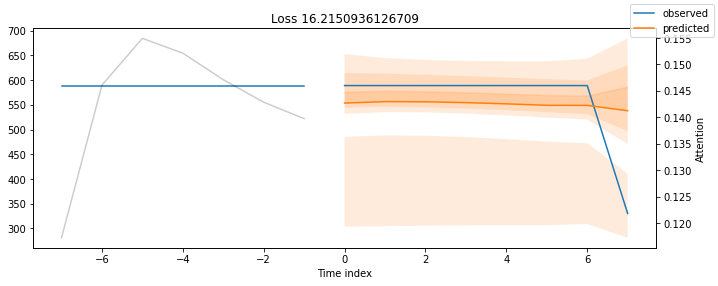

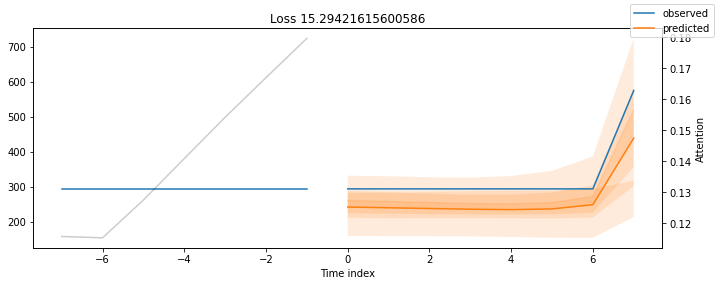

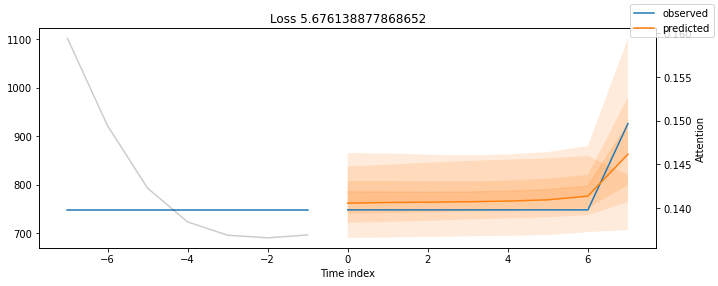

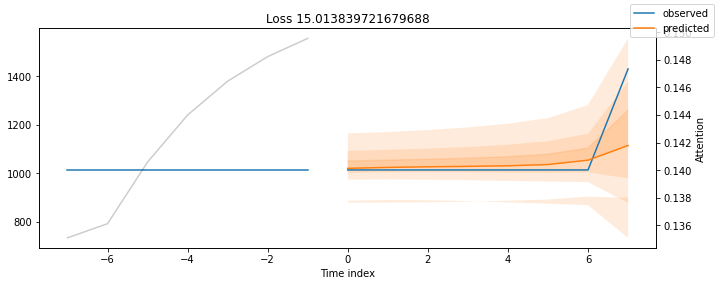

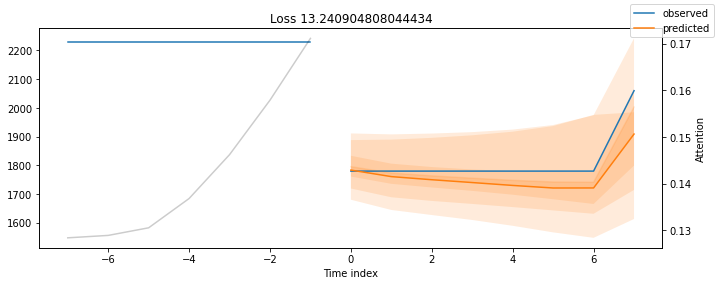

In [ ]:
for idx in range(5):  # plot all 5 consumers
    fig, ax = plt.subplots(figsize=(10, 4))
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True,ax=ax)

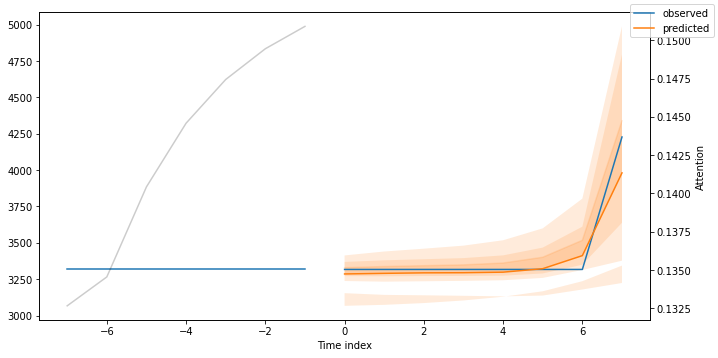

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))

raw_prediction, x = best_tft.predict(
    training.filter(lambda x: (x.new_confirmed_level == "4")),
    mode="raw",
    return_x=True,
)
best_tft.plot_prediction(x, raw_prediction, idx=0, ax=ax);

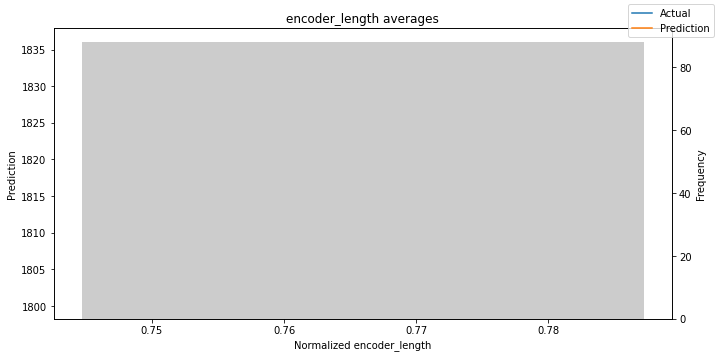

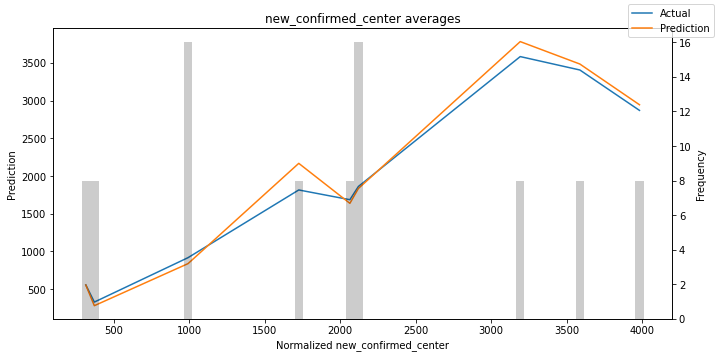

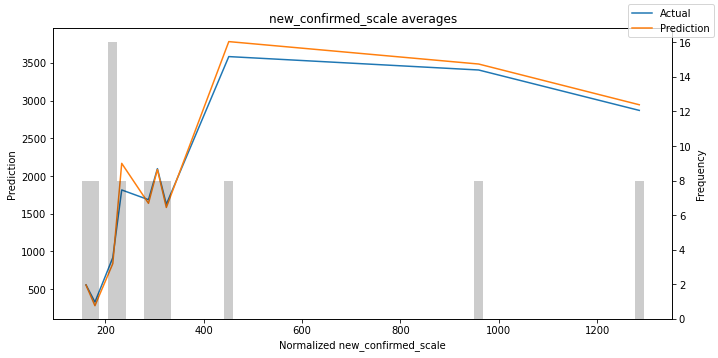

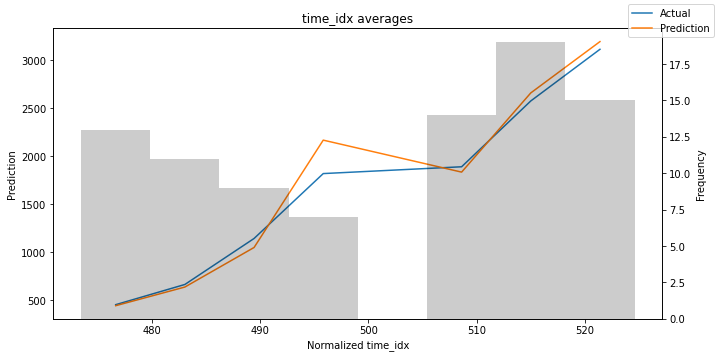

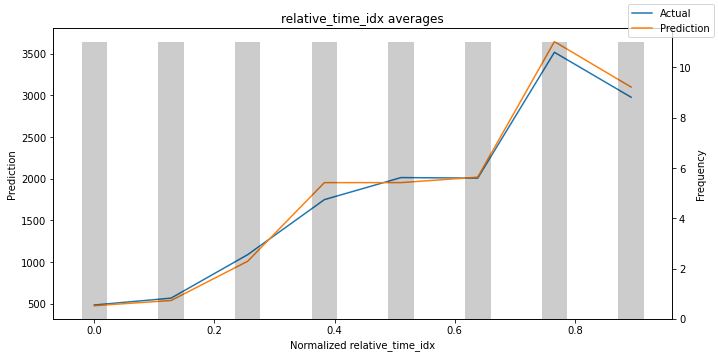

...

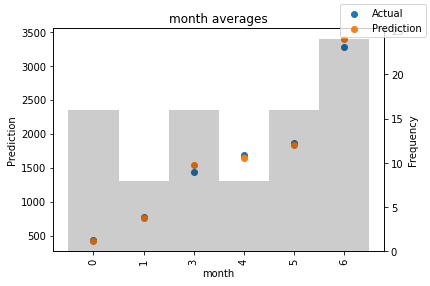

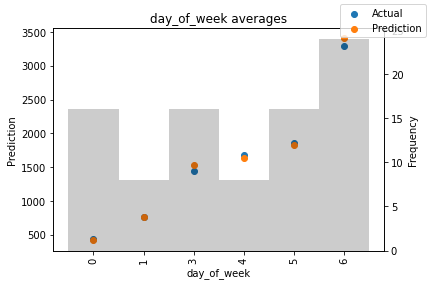

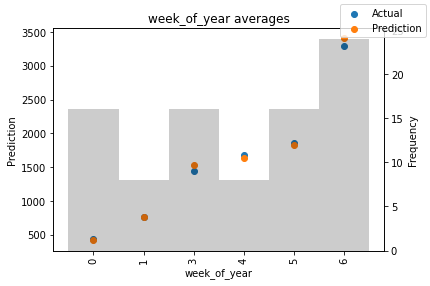

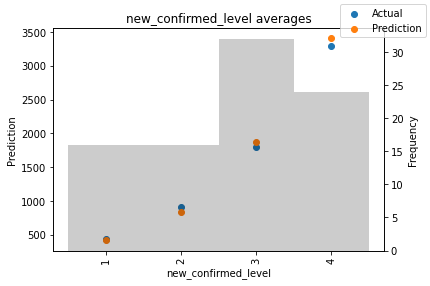

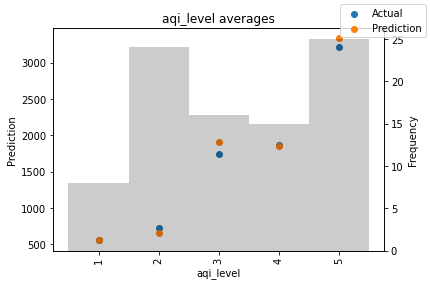

In [ ]:
predictions, x = best_tft.predict(val_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(x, predictions)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals);

In [ ]:
#select last 24 months from data (max_encoder_length is 24)
encoder_data = data[lambda x: x.time_idx > x.time_idx.max() - max_encoder_length]

# select last known data point and create decoder data from it by repeating it and incrementing the month
# in a real world dataset, we should not just forward fill the covariates but specify them to account
# for changes in special days and prices (which you absolutely should do but we are too lazy here)
last_data = data[lambda x: x.time_idx == x.time_idx.max()]
decoder_data = pd.concat(
    [last_data.assign(date=lambda x: x.date + pd.offsets.MonthBegin(i)) for i in range(1, max_prediction_length*5 + 1)],
    ignore_index=True,
)

# add time index consistent with "data"
decoder_data["time_idx"] = decoder_data["date"].dt.year * 12 + decoder_data["date"].dt.month
decoder_data["time_idx"] += encoder_data["time_idx"].max() + 1 - decoder_data["time_idx"].min()

In [ ]:
decoder_data

,new_confirmed,new_confirmed_level,aqi,aqi_level,pm25,pm10,co,o3,no2,so2,...,parks,transit stations,workplaces,residential,date,holiday,day_of_week,week_of_year,month,time_idx
0,0.0,0,100.0,2,50.0,20.0,3.7,15.9,11.9,1.6,...,-7.0,-12.0,-6.0,10.0,2021-09-01,0,3,3,3,528
1,0.0,0,100.0,2,50.0,20.0,3.7,15.9,11.9,1.6,...,-7.0,-12.0,-6.0,10.0,2021-10-01,0,3,3,3,529
2,0.0,0,100.0,2,50.0,20.0,3.7,15.9,11.9,1.6,...,-7.0,-12.0,-6.0,10.0,2021-11-01,0,3,3,3,530
3,0.0,0,100.0,2,50.0,20.0,3.7,15.9,11.9,1.6,...,-7.0,-12.0,-6.0,10.0,2021-12-01,0,3,3,3,531
4,0.0,0,100.0,2,50.0,20.0,3.7,15.9,11.9,1.6,...,-7.0,-12.0,-6.0,10.0,2022-01-01,0,3,3,3,532
5,0.0,0,100.0,2,50.0,20.0,3.7,15.9,11.9,1.6,...,-7.0,-12.0,-6.0,10.0,2022-02-01,0,3,3,3,533
6,0.0,0,100.0,2,50.0,20.0,3.7,15.9,11.9,1.6,...,-7.0,-12.0,-6.0,10.0,2022-03-01,0,3,3,3,534
7,0.0,0,100.0,2,50.0,20.0,3.7,15.9,11.9,1.6,...,-7.0,-12.0,-6.0,10.0,2022-04-01,0,3,3,3,535
8,0.0,0,100.0,2,50.0,20.0,3.7,15.9,11.9,1.6,...,-7.0,-12.0,-6.0,10.0,2022-05-01,0,3,3,3,536
9,0.0,0,100.0,2,50.0,20.0,3.7,15.9,11.9,1.6,...,-7.0,-12.0,-6.0,10.0,2022-06-01,0,3,3,3,537


In [ ]:
# combine encoder and decoder data
new_prediction_data = pd.concat([encoder_data, decoder_data], ignore_index=True)

{'attention': <Figure size 432x288 with 1 Axes>,
 'static_variables': <Figure size 504x198 with 1 Axes>,
 'encoder_variables': <Figure size 504x576 with 1 Axes>,
 'decoder_variables': <Figure size 504x252 with 1 Axes>}

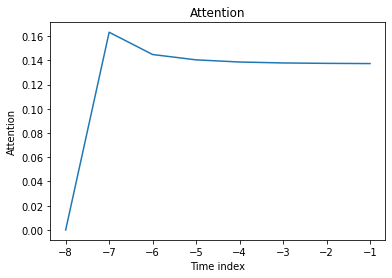

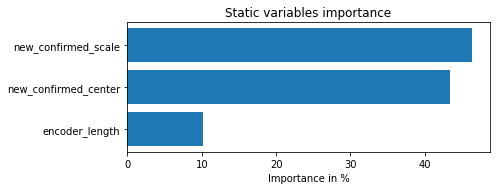

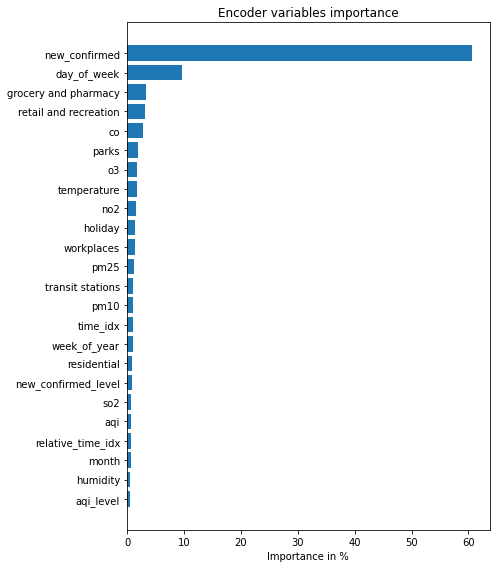

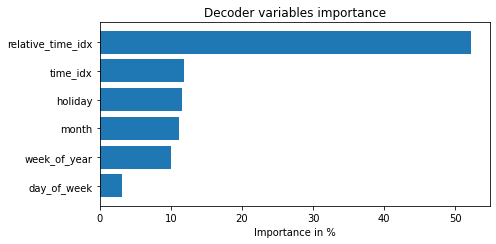

In [ ]:
interpretation = best_tft.interpret_output(raw_predictions, reduction="sum")
best_tft.plot_interpretation(interpretation)